In [1]:
import cv2
import numpy as np
from scipy.linalg import svd, rq, inv
import math
import matplotlib.pyplot as plt
import random

In [2]:
def construct_M(world_points, img_points):
    M = np.zeros((2*len(world_points),12))
    
    for i in range(len(world_points)):
        
        M[2*i][0] = -world_points[i][0]
        M[2*i][1] = -world_points[i][1]
        M[2*i][2] = -world_points[i][2]
        M[2*i][3] = -1
        M[2*i][4] = 0
        M[2*i][5] = 0        
        M[2*i][6] = 0
        M[2*i][7] = 0
        M[2*i][8] = img_points[i][0]*world_points[i][0]
        M[2*i][9] = img_points[i][0]*world_points[i][1]
        M[2*i][10] = img_points[i][0]*world_points[i][2]        
        M[2*i][11] = img_points[i][0]      
        

        M[2*i+1][0] = 0
        M[2*i+1][1] = 0        
        M[2*i+1][2] = 0
        M[2*i+1][3] = 0
        M[2*i+1][4] = -world_points[i][0]
        M[2*i+1][5] = -world_points[i][1]
        M[2*i+1][6] = -world_points[i][2]
        M[2*i+1][7] = -1        
        M[2*i+1][8] = img_points[i][1]*world_points[i][0]
        M[2*i+1][9] = img_points[i][1]*world_points[i][1]
        M[2*i+1][10] = img_points[i][1]*world_points[i][2]        
        M[2*i+1][11] = img_points[i][1]      
        
    return M

# Q1 DLT

In [3]:
def DLT(real_world_coor,image_world_coor):
    
    M = construct_M(real_world_coor,image_world_coor)
    u, s, v = svd(M)
    P = v[-1]
    P = P.reshape(3,4)
    
    x = (P @ real_world_coor.T).T
    x = x/(x[:,2].reshape(x.shape[0],1))

    error = np.sum(np.square(x - image_world_coor))/real_world_coor.shape[0]
    print(error)
    return P

# Q2 RANSAC

In [4]:
def RANSAC(real_world_coor,image_world_coor):
    mx = -1
    bestP = []
    minError = math.inf
    
    for i in range(10000):

        randomlist = random.sample(range(real_world_coor.shape[0]), 6)
        ran_world_points = real_world_coor[randomlist]
        corresponding_img_points = image_world_coor[randomlist]
        M = construct_M(ran_world_points,corresponding_img_points)

        u, s, v = svd(M)
        P = v[-1]
        P = P.reshape(3,4)

        x = (P @ ran_world_points.T).T
        x = x/(x[:,2].reshape(x.shape[0],1))
        
        error = np.sum(np.square(x - corresponding_img_points))/ran_world_points.shape[0]
        
        if error < minError:
            mx = i
            minError = error
            bestP = P
    
    print(mx,minError)
    return bestP

# Q3 Calculating parameters

In [5]:
def findParam(P):
    K, R = rq(P[:3,:3])
    T = inv(K) @ P[:,-1]
    return K,R,T

In [6]:
def showWireFrame(P,real_world_coor,img):
    x = (P @ real_world_coor.T).T
    x = x/(x[:,2].reshape(x.shape[0],1))
    x = x.astype('int32')
    color = (255, 0, 0)
    thickness = 3

    img1 = img.copy()

    for i in range(4):
        for j in range(4):
            img1 = cv2.line(img1, tuple(x[4*i+j,:2]), tuple(x[4*(i+1)+j,:2]), color, thickness)


    for i in range(5):
        img1 = cv2.line(img1, tuple(x[4*i,:2]), tuple(x[4*(i)+2,:2]), color, thickness)
        img1 = cv2.line(img1, tuple(x[4*i,:2]), tuple(x[4*(i)+1,:2]), color, thickness)
        img1 = cv2.line(img1, tuple(x[4*i+1,:2]), tuple(x[4*(i)+3,:2]), color, thickness)

    plt.imshow(img1)

In [7]:
img = cv2.imread('../data/black-dots.JPG')
mea = cv2.imread('../data/measurements.JPG')

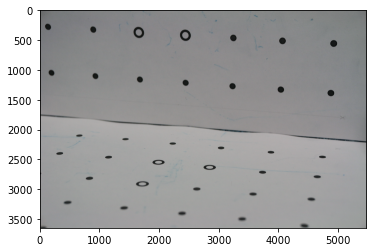

In [8]:
plt.imshow(img)

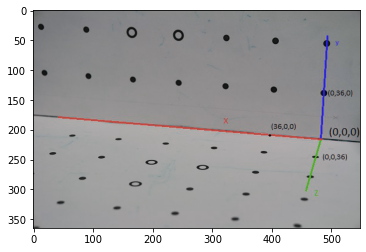

In [9]:
plt.imshow(mea)

In [10]:
np.shape(img)

(3648, 5472, 3)

In [11]:
real_world_coor = [[0,36,0,1],
                   [0,0,36,1],
                   
                   [0,72,0,1],
                   [0,0,72,1],
                  
                   [36,36,0,1],
                   [36,0,36,1],
                  
                   [36,72,0,1],
                   [36,0,72,1],
                  
                   [72,36,0,1],
                   [72,0,36,1],
                  
                   [72,72,0,1],
                   [72,0,72,1],
                  
                   [108,36,0,1],
                   [108,0,36,1],
                  
                   [108,72,0,1],
                   [108,0,72,1],
                   
                   [144,36,0,1],
                   [144,0,36,1],
                  
                   [144,72,0,1],
                   [144,0,72,1]
                 ]

In [12]:
image_world_coor = [[4880, 1400,1],
                    [4740, 2466,1],
                    
                    [4912, 576,1],
                    [4647, 2793,1],
                    
                    [4032, 1338,1],
                    [3870, 2384,1],
                    
                    [4063, 508,1],
                    [3734, 2714,1],
                    
                    [3221, 1292,1],
                    [3016, 2313,1],
                    
                    [3248, 471,1],
                    [2843, 2644,1],
                    
                    [2444, 1222,1],
                    [2225, 2236,1],
                    
                    [2433, 424,1],
                    [1988, 2535,1],
                    
                    [1683, 1180,1],
                    [1432, 2156,1],
                    
                    [1661, 379,1],
                    [1151, 2467,1]
                   ]

In [13]:
real_world_coor = np.array(real_world_coor)
image_world_coor = np.array(image_world_coor)

In [14]:
P = DLT(real_world_coor,image_world_coor)

133.44397989431678


In [15]:
K,R,T = findParam(P)

In [16]:
print("P is \n",P,"\n\n")
print("K is \n",K,"\n\n")
print("R is \n",R,"\n\n")
print("T is \n",T,"\n\n")

P is 
 [[-3.95633285e-03 -3.17101739e-04 -1.89845547e-03  9.10612941e-01]
 [-1.99464819e-04 -4.31545377e-03  7.33906602e-04  4.13213598e-01]
 [ 7.94903395e-08 -1.25702054e-07 -3.18820334e-07  1.89378001e-04]] 


K is 
 [[-4.29813426e-03 -4.05103507e-06  9.39830733e-04]
 [ 0.00000000e+00  4.30228988e-03  8.31774071e-04]
 [ 0.00000000e+00  0.00000000e+00  3.51804102e-07]] 


R is 
 [[ 0.96996805 -0.00347191  0.24320756]
 [-0.09004615 -0.93398056  0.34579186]
 [ 0.22595058 -0.35730696 -0.90624394]] 


T is 
 [-94.14889464  -8.02706602 538.30526665] 




In [17]:
P = RANSAC(real_world_coor,image_world_coor)

/var/folders/np/d4d0jmlx4sl1x9nywtlnvvlr0000gn/T/ipykernel_6246/3535800043.py:18: RuntimeWarning: invalid value encountered in true_divide
  x = x/(x[:,2].reshape(x.shape[0],1))


4077 3.889520970989251e-06


In [18]:
K,R,T = findParam(P)

In [19]:
print("P is \n",P,"\n\n")
print("K is \n",K,"\n\n")
print("R is \n",R,"\n\n")
print("T is \n",T,"\n\n")

P is 
 [[-4.00490649e-03 -4.87106315e-04 -1.84993548e-03  9.11909985e-01]
 [-2.35112194e-04 -4.27113193e-03  7.84544536e-04  4.10343188e-01]
 [ 3.80377730e-08 -1.32332039e-07 -2.50114101e-07  1.88037342e-04]] 


K is 
 [[-4.23968759e-03 -2.03627420e-05  1.31280020e-03]
 [ 0.00000000e+00  4.16210709e-03  1.26103943e-03]
 [ 0.00000000e+00  0.00000000e+00  2.85509552e-07]] 


R is 
 [[ 0.98634155 -0.02437266  0.16289973]
 [-0.0968542  -0.88576467  0.45391654]
 [ 0.13322767 -0.46349426 -0.87602709]] 


T is 
 [ -10.67074356 -100.95384155  658.60263141] 




As we can observe the error in RANSAC method is drastically lower as compared to the DLT method

# Q4 Radial distortion

In [20]:
worldCoords = np.array([[0,36,0],
                        [0,72,0],
                        [36,36,0],
                        [36,72,0],
                        [72,36,0],
                        [72,72,0],
                        [108,36,0],
                        [108,72,0],
                        [144,36,0],
                        [144,72,0]])

imageCoords = np.array([[4880, 1400],
                    [4912, 576],
                    [4032, 1338],
                    [4063, 508],
                    [3221, 1292],
                    [3248, 471],
                    [2444, 1222],
                    [2433, 424],
                    [1683, 1180],
                    [1661, 379]])

In [21]:
ret, matrix, dist, rvecs, tvecs = cv2.calibrateCamera([worldCoords.astype('float32')], [imageCoords.astype('float32')], (img.shape[1],img.shape[0]), None, None)

In [22]:
undistortedimg = cv2.undistort(img, matrix, dist)

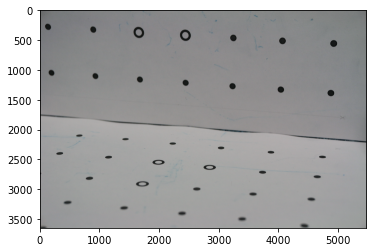

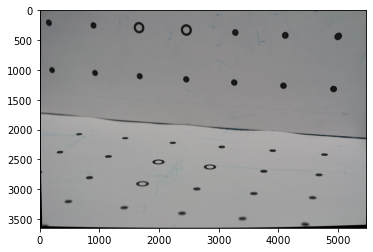

In [23]:
plt.imshow(img)
plt.show()
plt.imshow(undistortedimg)

In [24]:
cv2.imwrite('../images/Undistorted.jpg', undistortedimg)

True

In [25]:
undistor_image_world_coor = [[4916, 1332,1],
                             [4763,2431,1],
                             [4986,450,1],
                             [4662,2769,1],
                             [4078,1280,1],
                             [3889,2367,1],
                             [4101,440,1],
                             [3749,2711,1],
                             [3252,1241,1],
                             [3043,2291,1],
                             [3281,388,1],
                             [2857,2631,1],
                             [2455,1178,1],
                             [2233,2226,1],
                             [2447,331,1],
                             [1979,2544,1],
                             [1671,1117,1],
                             [1426,2157,1],
                             [1661,302,1],
                             [1147,2454,1]]

In [26]:
undistor_image_world_coor = np.array(undistor_image_world_coor)

In [27]:
P = DLT(real_world_coor,undistor_image_world_coor)

140.98094469765314


In [28]:
K,R,T = findParam(P)

In [29]:
print("P is \n",P,"\n\n")
print("K is \n",K,"\n\n")
print("R is \n",R,"\n\n")
print("T is \n",T,"\n\n")

P is 
 [[-4.00454906e-03 -3.56773628e-04 -1.88093878e-03  9.14490569e-01]
 [-1.86168538e-04 -4.45458275e-03  8.23138654e-04  4.04557421e-01]
 [ 7.25429539e-08 -1.46901834e-07 -3.04008949e-07  1.88820844e-04]] 


K is 
 [[-4.33161527e-03 -6.98296877e-05  9.66366511e-04]
 [ 0.00000000e+00  4.39044593e-03  1.13115339e-03]
 [ 0.00000000e+00  0.00000000e+00  3.45346305e-07]] 


R is 
 [[ 0.97291253  0.00205511  0.23116441]
 [-0.09652254 -0.90501465  0.41428478]
 [ 0.21005858 -0.42537543 -0.88030173]] 


T is 
 [-88.35497545 -48.72163557 546.75796939] 




In [30]:
P1 = RANSAC(real_world_coor,undistor_image_world_coor)

/var/folders/np/d4d0jmlx4sl1x9nywtlnvvlr0000gn/T/ipykernel_6246/3535800043.py:18: RuntimeWarning: invalid value encountered in true_divide
  x = x/(x[:,2].reshape(x.shape[0],1))
/var/folders/np/d4d0jmlx4sl1x9nywtlnvvlr0000gn/T/ipykernel_6246/3535800043.py:18: RuntimeWarning: divide by zero encountered in true_divide
  x = x/(x[:,2].reshape(x.shape[0],1))


4586 4.8254001962553134e-08


In [31]:
K,R,T = findParam(P1)

In [32]:
print("P is \n",P1,"\n\n")
print("K is \n",K,"\n\n")
print("R is \n",R,"\n\n")
print("T is \n",T,"\n\n")

P is 
 [[-3.78367285e-03  2.33786730e-04 -2.59780357e-03  9.13497872e-01]
 [ 3.43578132e-05 -4.48372161e-03  1.22907299e-04  4.06792778e-01]
 [ 1.95878301e-07  2.69916723e-08 -5.53185967e-07  1.84645146e-04]] 


K is 
 [[-4.43024868e-03 -2.51767655e-04  1.19537841e-03]
 [ 0.00000000e+00  4.47479229e-03 -3.10290359e-04]
 [ 0.00000000e+00  0.00000000e+00  5.87461976e-07]] 


R is 
 [[ 0.94227114  0.01638832  0.33444959]
 [ 0.03079883 -0.99880947 -0.03782944]
 [ 0.33343145  0.04594625 -0.94165408]] 


T is 
 [-127.79268488  112.7024662   314.30995344] 




As we can see, the parameters have changed due to our correcting radial distortion

# Q8 image of world origin

The image of world origin is given by the last column of the P matrix. This is calculated below

In [33]:
(P[:,3]/P[2,3]).astype('int32')

array([4843, 2142,    1], dtype=int32)

As we can see the image of world origin is predicted as (4843, 2142,1) which is what our world origin is (see image below for confirmation)

# Q5 wireframe

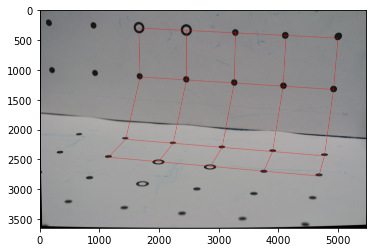

In [34]:
showWireFrame(P,real_world_coor,undistortedimg)

The overlay is not perfect but it is a very good estimation for our image

# Q6 Zhang

In [35]:
def string_var(var):
    
    if var < 10:
        return "0" + str(var)
    else:
        return str(var)

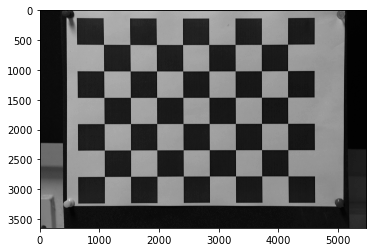

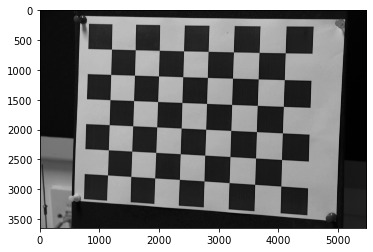

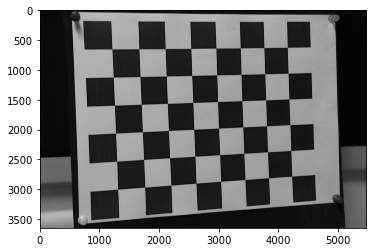

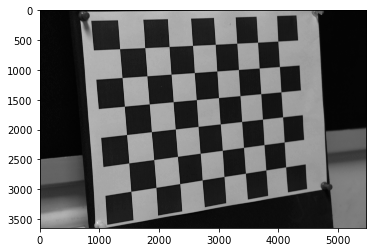

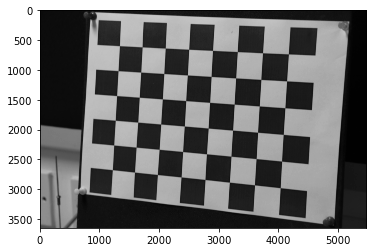

...

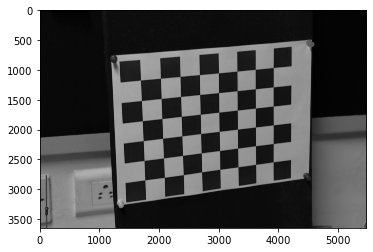

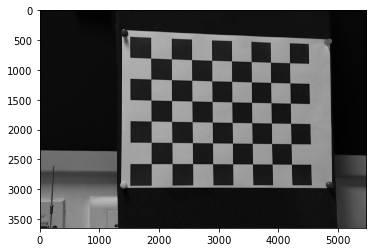

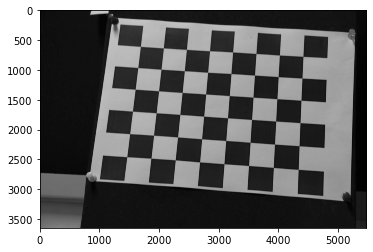

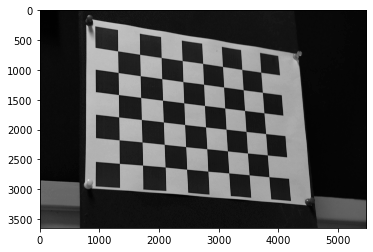

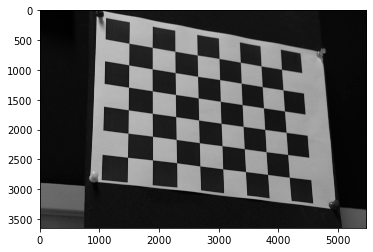

In [36]:
real_points = [] 
img_points = [] 
x,y = np.meshgrid(range(6), range(8))
world = np.hstack((x.reshape(48, 1), y.reshape(48, 1), np.zeros((48, 1)))).astype('float32')
   
for i in range(15): 
    
    val = string_var(i+1)
    image = cv2.imread("../data/checkerboard-" + val + ".JPG") 
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    plt.imshow(gray_image,'Greys_r')
    plt.show()
    ret, corners = cv2.findChessboardCorners(gray_image, (6, 8))
    if ret:
        img_points.append(corners)
        real_points.append(world)

ret, matrix, dist, rvecs, tvecs = cv2.calibrateCamera(real_points, img_points, (gray_image.shape[1],gray_image.shape[0]), None, None)

In [37]:
print("P is \n",matrix,"\n\n")

P is 
 [[1.36634770e+04 0.00000000e+00 3.33653554e+03]
 [0.00000000e+00 1.36813826e+04 1.49660052e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] 




# Q7 wireoverlay

In [38]:
x = []
for i in range(len(real_points)):
    pred, _ = cv2.projectPoints(real_points[i], rvecs[i], tvecs[i], matrix, dist)
    x.append(pred)

x = np.array(x).reshape((-1, 2))

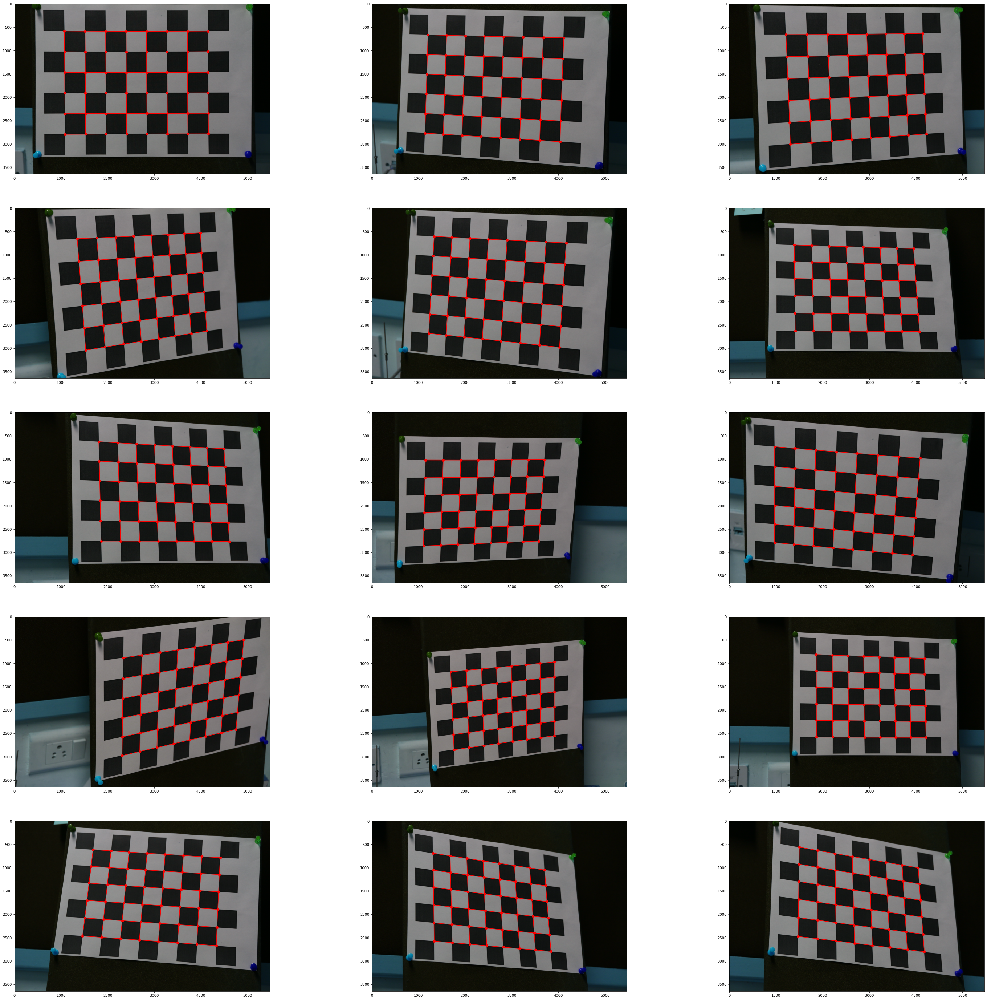

In [39]:
plt.figure(figsize=(50, 50))

for i in range(15): 
    
    val = string_var(i+1)
    image = cv2.imread("../data/checkerboard-" + val + ".JPG")
    ax = plt.subplot(5, 3, i + 1)
    for j in range(8):
        ax.plot(x[i * 48 + j * 6:i * 48 + j * 6 + 6, 0], x[i * 48 + j * 6:i * 48 + j * 6 + 6, 1], 'ro-')
    for j in range(6):
        idx = np.arange(i * 48 + j, (i + 1) * 48 + j, 6)
        ax.plot(x[idx][:, 0], x[idx][:, 1], 'ro-')

    ax.imshow(image)

Observation of 6 and 7 :: The wireoverlay is perfect. This is an improvement over the ransac and DLT methods

# Q10 Image from personal camera

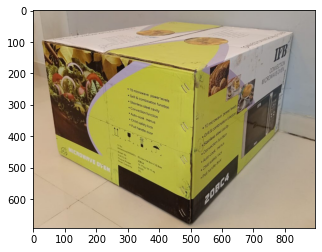

In [40]:
img = cv2.imread('../images/box.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

In [41]:
real_world_coor = [[0, 0, 0, 1],
                   [51.6, 0, 0, 1],
                   [0, 31, 0, 1],
                   [0, 0, 44.2, 1],
                   [51.6, 31, 0, 1],
                   [0, 31, 44.2, 1],
                   [51.6, 0, 44.2, 1],
                   [51.6/2, 0, 0, 1],
                   [0, 31/2, 0, 1],
                   [0, 0, 44.2/2, 1],    
                   [51.6/2, 31, 0, 1],
                   [51.6, 31/2, 0, 1],
                   [0, 31/2, 44.2, 1],
                   [0, 31, 44.2/2, 1],
                   [51.6/2, 0, 44.2, 1],
                   [51.6, 0, 44.2/2, 1],
                   [51.6/2, 31/2, 0, 1],
                   [0, 31/2, 44.2/2, 1],
                   [51.6/2, 0, 44.2/2, 1],
                   [10, 0, 0, 1]
                  ]

In [42]:
image_world_coor = [[707, 407, 1],
                    [1018, 285, 1],
                    [691, 893, 1],
                    [221, 310, 1],
                    [973, 594, 1],
                    [273, 669, 1],
                    [632, 248, 1],
                    [906, 329, 1],
                    [692, 671, 1],
                    [416, 354, 1],
                    [872, 702, 1],
                    [991, 447, 1],
                    [250, 512, 1],
                    [443, 760, 1],
                    [475, 272, 1],
                    [793, 264, 1],
                    [887, 525, 1],
                    [431, 573, 1],
                    [630, 300, 1],
                    [699, 586, 1]
                   ]

In [43]:
real_world_coor = np.array(real_world_coor)
image_world_coor = np.array(image_world_coor)

In [44]:
P = DLT(real_world_coor,image_world_coor)

2202.7375650794115


In [45]:
K,R,T = findParam(P)

In [46]:
print("P is \n",P,"\n\n")
print("K is \n",K,"\n\n")
print("R is \n",R,"\n\n")
print("T is \n",T,"\n\n")

P is 
 [[-1.83916977e-02 -2.38572525e-03  1.06497779e-02 -8.24794823e-01]
 [ 6.81431543e-04 -1.87011352e-02  1.35384580e-03 -5.64714692e-01]
 [-1.09663670e-05 -3.67631311e-06 -7.42936029e-06 -1.19305397e-03]] 


K is 
 [[-1.91240270e-02  5.92864698e-04  9.55427137e-03]
 [ 0.00000000e+00  1.83887641e-02  3.72599795e-03]
 [ 0.00000000e+00  0.00000000e+00  1.37467042e-05]] 


R is 
 [[ 0.56931657 -0.03870551 -0.82120675]
 [ 0.19869897 -0.96279896  0.18313079]
 [-0.79774518 -0.26743233 -0.54044665]] 


T is 
 [ -0.63719558 -13.12439632 -86.78836354] 




In [47]:
P1 = RANSAC(real_world_coor,image_world_coor)

/var/folders/np/d4d0jmlx4sl1x9nywtlnvvlr0000gn/T/ipykernel_6246/3535800043.py:18: RuntimeWarning: invalid value encountered in true_divide
  x = x/(x[:,2].reshape(x.shape[0],1))


3327 2.620400586968035e-08


In [48]:
K,R,T = findParam(P1)

In [49]:
print("P is \n",P,"\n\n")
print("K is \n",K,"\n\n")
print("R is \n",R,"\n\n")
print("T is \n",T,"\n\n")

P is 
 [[-1.83916977e-02 -2.38572525e-03  1.06497779e-02 -8.24794823e-01]
 [ 6.81431543e-04 -1.87011352e-02  1.35384580e-03 -5.64714692e-01]
 [-1.09663670e-05 -3.67631311e-06 -7.42936029e-06 -1.19305397e-03]] 


K is 
 [[-1.95188984e-02  3.04164740e-03  2.39427330e-02]
 [ 0.00000000e+00 -2.14505597e-02  9.65818134e-03]
 [ 0.00000000e+00  0.00000000e+00  1.69613921e-05]] 


R is 
 [[ 0.04508553  0.10301266  0.99365773]
 [ 0.33078007 -0.94009907  0.08245164]
 [ 0.94263028  0.3249648  -0.07645941]] 


T is 
 [43.4661399   9.55692688 70.843018  ] 




In this image too, RANSAC method gives better results

In this assignment, I learnt how to caliberate the camera using different techniques. The challenges i faced was correcting radial distortion and applying wireframe overlay for images. In the last question, I had to repeat the experiment a couple of times to get accurate measurements of world and image points